### **Section-A: Pixels and Storage**

#### **Part-1**
---
#### Question A
**Horizontal resolution.** Using the aspect ratio:
$$
H = V \times \frac{16}{9} = 1125 \times \frac{16}{9} = 2000
$$
**Answer:** **2000 pixels/line**

---

#### Question B
**Pixels per frame.** A frame has:
$$
N_{\text{px/frame}} = H \times V = 2000 \times 1125 = 2,250,000
$$
**Answer:** **2,250,000 pixels per frame (2.25 MP).**

---

#### Question C
**Pixel–coordinate convention used.**  
• Origin at **top-left**.  
• x increases **to the right**, y increases **downward**.  
• In Python/NumPy: `img[y, x]` with **0-based indexing**.  
• Coordinates refer to **pixel centers**.  

**Answer:** Top-left origin; x → right, y ↓ down; 0-based `img[y, x]`.

---

#### Question D
**Bits to store one frame (24 bpp).** Each pixel uses 24 bits:
$$
\text{bits/frame} = 2,250,000 \times 24 = 54,000,000
$$
This equals:
$$
54,000,000 / 8 = 6,750,000 \ \text{bytes}
$$
≈ **6.75 MB (decimal)**.  

**Answer:** **54,000,000 bits/frame (~6.75 MB).**

---

#### Question E
**Storage for a 2-hour movie (30 fps).** Frames:
$$
\text{frames} = 2 \times 3600 \times 30 = 216,000
$$
Total bits:
$$
216,000 \times 54,000,000 = 1.1664 \times 10^{13}
$$
Bytes:
$$
1.1664 \times 10^{13} / 8 = 1.458 \times 10^{12}
$$
Using the assignment’s convention **1 GB = \(2^{30}\) bytes**:
$$
\frac{1.458 \times 10^{12}}{2^{30}} \approx \mathbf{1{,}358\ \text{GB}}
$$
(= **≈ 1,358 GiB**; for reference, this is ≈ **1.458 TB** in decimal units.)  

**Answer:** **~1,358 GB** (with 1 GB = 2^30 bytes) of uncompressed storage for 2 hours at 30 fps.

---

#### Question F
**After downsampling by 2 in both directions.**  
New resolution:
$$
H' = 2000/2 = 1000, \quad V' = \lceil 1125/2 \rceil = 563
$$
Pixels per frame:
$$
1000 \times 563 = 563,000
$$
Bits per frame:
$$
563,000 \times 24 = 13,512,000
$$
≈ **1.69 MB**.  

**Answer:** **1000×563 = 563,000 px; ~13.5 Mb/frame (~¼ of original).**

---

#### Question G
**If color depth reduces from 24 bpp to 12 bpp.** Storage halves.  

Per frame (full resolution):
$$
2,250,000 \times 12 = 27,000,000 \ \text{bits} = 3.375 \ \text{MB}
$$
Two-hour movie (full resolution) — new size:
$$
\text{Decimal: } \approx 0.729\ \text{TB} \quad \text{and} \quad
\text{GB with } 1\ \text{GB}=2^{30}\ \text{bytes: } \frac{0.729 \times 10^{12}}{2^{30}} \approx \mathbf{679\ \text{GB}}.
$$
**Storage saved:** Half of the original → **~0.729 TB (decimal)** ≈ **679 GB** (1 GB = \(2^{30}\) bytes).  

**Answer:** **New size ≈ 0.729 TB (≈ 679 GB); storage saved ≈ 0.729 TB (≈ 679 GB).**

##### **Part-2**

Original Size: (600, 600)
Adjusted Size: (592, 333)
Original Pixels: 360000
Adjusted Pixels: 197136


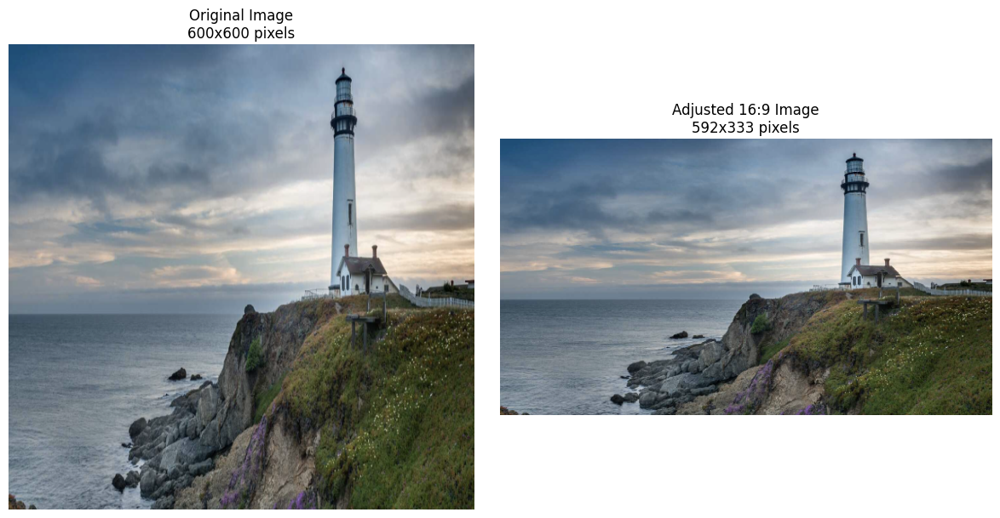

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def AspectRatioParts(RatioStr):
    Wstr, Hstr = RatioStr.split(":")
    return int(Wstr), int(Hstr)

def AdjustResolution(ImagePath, RatioStr="16:9"):
    TargetW, TargetH = AspectRatioParts(RatioStr)
    Image = cv2.imread(ImagePath, cv2.IMREAD_COLOR)
    Height, Width = Image.shape[:2]
    Scale = min(Width // TargetW, Height // TargetH)
    NewW = TargetW * Scale
    NewH = TargetH * Scale
    Pixels = int(NewW * NewH)
    return (Width, Height), (NewW, NewH), Pixels, Image

def ResizeNearest(Image, NewW, NewH):
    H0, W0 = Image.shape[:2]
    Y = (np.arange(NewH) * (H0 / NewH)).astype(np.int64)
    X = (np.arange(NewW) * (W0 / NewW)).astype(np.int64)
    return Image[Y[:, None], X[None, :]]

PathImage = r"X:\Projects\DIP\Assignment-1\fig1_a.png"
SaveImage = r"X:\Projects\DIP\Assignment-1\fig1_a_resized.png"
OrigSize, NewSize, PixelCount, OrigImg = AdjustResolution(PathImage, "16:9")
ResizedImg = ResizeNearest(OrigImg, NewSize[0], NewSize[1])
OrigPixels = OrigSize[0] * OrigSize[1]
print("Original Size:", OrigSize)
print("Adjusted Size:", NewSize)
print("Original Pixels:", OrigPixels)
print("Adjusted Pixels:", PixelCount)
cv2.imwrite(SaveImage, ResizedImg)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(OrigImg[:, :, ::-1])
plt.title(f"Original Image\n{OrigSize[0]}x{OrigSize[1]} pixels")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(ResizedImg[:, :, ::-1])
plt.title(f"Adjusted 16:9 Image\n{NewSize[0]}x{NewSize[1]} pixels")
plt.axis("off")
plt.tight_layout()
plt.show()

### **Section-B: Operations on Image I**


##### **Image D from Image A**

In [2]:
import cv2
import numpy as np

def PaintTopWhite(BinaryMask, X1, X2, YTop):
    Height, Width = BinaryMask.shape
    X1c = max(0, X1)
    X2c = min(Width, X2)
    Yc = min(Height, YTop)
    if X1c < X2c and Yc > 0:
        BinaryMask[0:Yc, X1c:X2c] = 255
        
InputPath = r"X:\Projects\DIP\Assignment-1\fig1_a.png"
OutputPath = r"X:\Projects\DIP\Assignment-1\fig1_d.png"
ThresholdValue = 150
ImgA = cv2.imread(InputPath)
GrayImage = (0.114 * ImgA[:, :, 0] + 0.587 * ImgA[:, :, 1] + 0.299 * ImgA[:, :, 2]).astype(np.uint8)
BinaryMask = np.where(GrayImage > ThresholdValue, 255, 0).astype(np.uint8)
PaintTopWhite(BinaryMask, 0, 410, 300)
PaintTopWhite(BinaryMask, 450, 600, 250)
MaskD = np.stack([BinaryMask, BinaryMask, BinaryMask], axis=-1)
cv2.imwrite(OutputPath, MaskD)
print(f"Successfully generated Image (D) as a 3-channel binary mask from Image (A). Saved at: {OutputPath}")

Successfully generated Image (D) as a 3-channel binary mask from Image (A). Saved at: X:\Projects\DIP\Assignment-1\fig1_d.png


##### **Part-1**

- **Image e** = function **(A)** `g(I1, I2)` with **I1 = image (d)** and **I2 = image (b)**.  

- **Image f** = function **(C)** `f(I1, I2, 0.5, 0.5, 0)` with **I1 = image (a)** and **I2 = image (c)**.  

- **Image g** = function **(D)** `f(I1, I2, 0.8, 0.2, 6)` with **I1 = image (b)** and **I2 = image (d)**.  

- **Image h** = function **(B)** `g(I1, 255 − I2)` with **I1 = image (b)** and **I2 = image (c)**.  

##### **Part-2**

Loaded Image A: (600, 600, 3) from 'X:\Projects\DIP\Assignment-1\fig1_a.png'
Loaded Image B: (600, 600, 3) from 'X:\Projects\DIP\Assignment-1\fig1_b.png'
Loaded Image C: (600, 600, 3) from 'X:\Projects\DIP\Assignment-1\fig1_c.png'
Loaded Image D: (600, 600, 3) from 'X:\Projects\DIP\Assignment-1\fig1_d.png'

Generated Image E using HistogramMatch with I1=Image D (source) and I2=Image B (reference).
Generated Image F using CombineWeightedModulo(I1=Image A, I2=Image C, k1=0.5, k2=0.5, k3=0).
Generated Image G using CombineWeightedModulo(I1=Image B, I2=Image D, k1=0.8, k2=0.2, k3=6).
Generated Image H using HistogramMatch with I1=Image B (source) and I2=(255 - Image C) (reference).


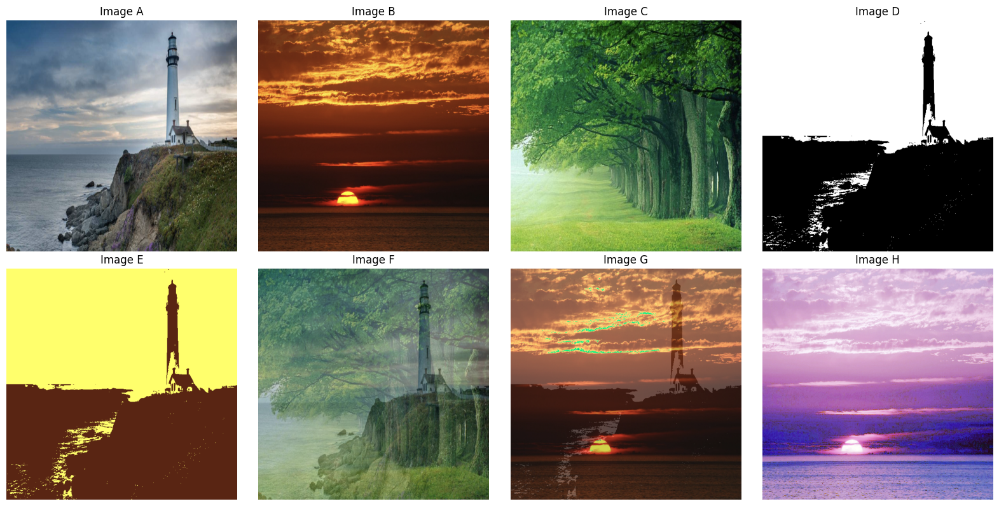

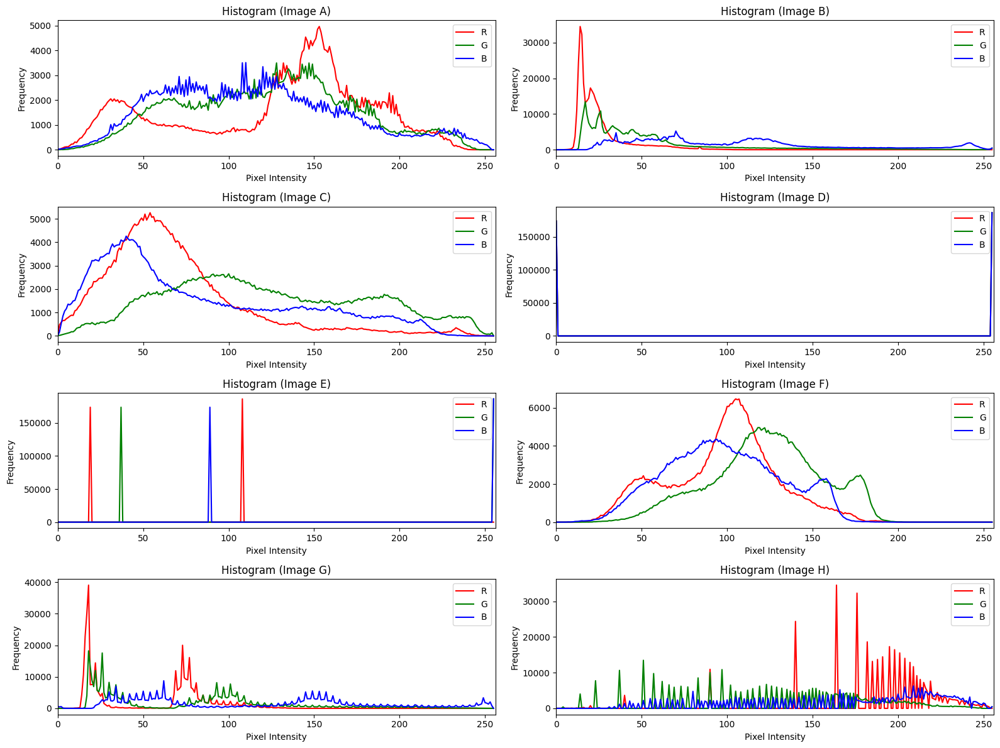

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

InputPathA = r"X:\Projects\DIP\Assignment-1\fig1_a.png"
InputPathB = r"X:\Projects\DIP\Assignment-1\fig1_b.png"
InputPathC = r"X:\Projects\DIP\Assignment-1\fig1_c.png"
InputPathD = r"X:\Projects\DIP\Assignment-1\fig1_d.png"

def CombineWeightedModulo(I1, I2, K1, K2, K3):
    return ((I1.astype(np.float32) * K1 + I2.astype(np.float32) * K2 + K3) % 255).astype(np.uint8)

def HistogramMatch(Source, Reference):
    Matched = np.zeros_like(Source)
    for Ch in range(Source.shape[2]):
        Src = Source[:, :, Ch].ravel()
        Ref = Reference[:, :, Ch].ravel()
        SValues, SInvIdx, SCounts = np.unique(Src, return_inverse=True, return_counts=True)
        RValues, RCounts = np.unique(Ref, return_counts=True)
        SCdf = np.cumsum(SCounts).astype(np.float64); SCdf /= SCdf[-1]
        RCdf = np.cumsum(RCounts).astype(np.float64); RCdf /= RCdf[-1]
        MapVals = np.interp(SCdf, RCdf, RValues)
        Matched[:, :, Ch] = MapVals[SInvIdx].reshape(Source[:, :, Ch].shape).astype(np.uint8)
    return Matched

ImgA = cv2.imread(InputPathA)
ImgB = cv2.imread(InputPathB)
ImgC = cv2.imread(InputPathC)
ImgD = cv2.imread(InputPathD)

print(f"Loaded Image A: {ImgA.shape} from '{InputPathA}'")
print(f"Loaded Image B: {ImgB.shape} from '{InputPathB}'")
print(f"Loaded Image C: {ImgC.shape} from '{InputPathC}'")
print(f"Loaded Image D: {ImgD.shape} from '{InputPathD}'\n")

ImgE = HistogramMatch(ImgD, ImgB)
print("Generated Image E using HistogramMatch with I1=Image D (source) and I2=Image B (reference).")
ImgF = CombineWeightedModulo(ImgA, ImgC, 0.5, 0.5, 0)
print("Generated Image F using CombineWeightedModulo(I1=Image A, I2=Image C, k1=0.5, k2=0.5, k3=0).")
ImgG = CombineWeightedModulo(ImgB, ImgD, 0.8, 0.2, 6)
print("Generated Image G using CombineWeightedModulo(I1=Image B, I2=Image D, k1=0.8, k2=0.2, k3=6).")
ImgH = HistogramMatch(ImgB, 255 - ImgC)
print("Generated Image H using HistogramMatch with I1=Image B (source) and I2=(255 - Image C) (reference).")

Titles = ["Image A", "Image B", "Image C", "Image D", "Image E", "Image F", "Image G", "Image H"]
Images = [ImgA, ImgB, ImgC, ImgD, ImgE, ImgF, ImgG, ImgH]

plt.figure(figsize=(16, 8))
for Index, (Im, Title) in enumerate(zip(Images, Titles), 1):
    plt.subplot(2, 4, Index)
    plt.imshow(Im[:, :, ::-1])
    plt.title(Title)
    plt.axis("off")
plt.tight_layout()
plt.show()

cv2.imwrite(r"X:\Projects\DIP\Assignment-1\fig1_e.png", ImgE)
cv2.imwrite(r"X:\Projects\DIP\Assignment-1\fig1_f.png", ImgF)
cv2.imwrite(r"X:\Projects\DIP\Assignment-1\fig1_g.png", ImgG)
cv2.imwrite(r"X:\Projects\DIP\Assignment-1\fig1_h.png", ImgH)

plt.figure(figsize=(16, 12))
for Index, (Im, Title) in enumerate(zip(Images, Titles), 1):
    plt.subplot(4, 2, Index)
    for ChannelIndex, (ChannelName, Color) in enumerate(zip(("R", "G", "B"), ("red", "green", "blue"))):
        Hist, _ = np.histogram(Im[:, :, ChannelIndex].ravel(), bins=256, range=(0, 256))
        plt.plot(Hist, color=Color, label=ChannelName)
    plt.xlim([0, 256])
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.title(f"Histogram ({Title})")
    plt.legend()
plt.tight_layout()
plt.show()

##### **Part-3**

HistogramMatchColor: Processing 3 channels for images of shape (600, 600).
HistogramMatchColor: Matching channel 0.
HistogramMatchGray: Matching source (600, 600) to reference (600, 600).
HistogramMatchGray: Completed
HistogramMatchColor: Matching channel 1.
HistogramMatchGray: Matching source (600, 600) to reference (600, 600).
HistogramMatchGray: Completed
HistogramMatchColor: Matching channel 2.
HistogramMatchGray: Matching source (600, 600) to reference (600, 600).
HistogramMatchGray: Completed
HistogramMatchColor: Completed


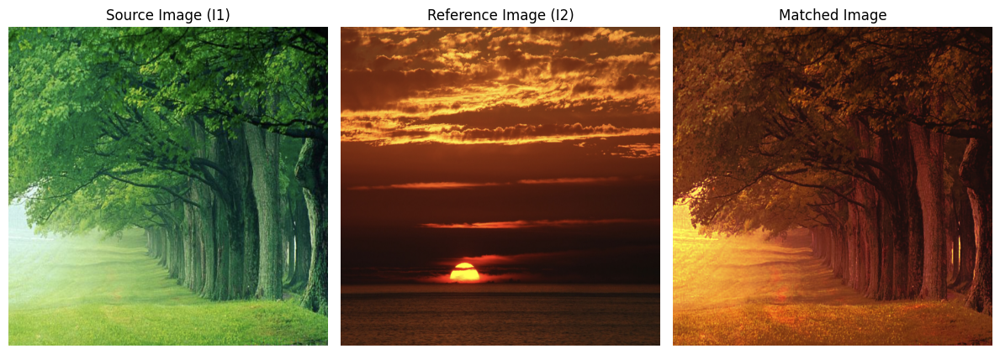

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def HistogramMatchGray(Source: np.ndarray, Reference: np.ndarray) -> np.ndarray:
    if Source.ndim != 2 or Reference.ndim != 2:
        raise ValueError("HistogramMatchGray expects single-channel images of shape (H, W).")
    print(f"HistogramMatchGray: Matching source {Source.shape} to reference {Reference.shape}.")
    SourceFlattened = Source.ravel()
    ReferenceFlattened = Reference.ravel()
    SourceValues, SourceInverseIndex, SourceCounts = np.unique(SourceFlattened, return_inverse=True, return_counts=True)
    ReferenceValues, ReferenceCounts = np.unique(ReferenceFlattened, return_counts=True)
    SourceCdf = np.cumsum(SourceCounts, dtype=np.float64)
    SourceCdf /= SourceCdf[-1]
    ReferenceCdf = np.cumsum(ReferenceCounts, dtype=np.float64)
    ReferenceCdf /= ReferenceCdf[-1]
    MappedValues = np.interp(SourceCdf, ReferenceCdf, ReferenceValues)
    MatchedImage = MappedValues[SourceInverseIndex].reshape(Source.shape).astype(np.uint8)
    print("HistogramMatchGray: Completed")
    return MatchedImage

def HistogramMatchColor(Source: np.ndarray, Reference: np.ndarray) -> np.ndarray:
    if Source.ndim != 3 or Reference.ndim != 3 or Source.shape[2] != Reference.shape[2]:
        raise ValueError("HistogramMatchColor expects (H, W, C) images with identical channel counts.")
    print(f"HistogramMatchColor: Processing {Source.shape[2]} channels for images of shape {Source.shape[:2]}.")

    Matched = np.empty_like(Source)
    for ChannelIndex in range(Source.shape[2]):
        print(f"HistogramMatchColor: Matching channel {ChannelIndex}.")
        Matched[..., ChannelIndex] = HistogramMatchGray(Source[..., ChannelIndex], Reference[..., ChannelIndex])

    print("HistogramMatchColor: Completed")
    return Matched

InputSourcePath = r"X:\Projects\DIP\Assignment-1\fig1_c.png"
InputReferencePath = r"X:\Projects\DIP\Assignment-1\fig1_b.png"
SourceImage = cv2.imread(InputSourcePath)
ReferenceImage = cv2.imread(InputReferencePath)
MatchedImage = HistogramMatchColor(SourceImage, ReferenceImage)
SourceRGB = SourceImage[:, :, ::-1]
ReferenceRGB = ReferenceImage[:, :, ::-1]
MatchedRGB = MatchedImage[:, :, ::-1]

plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(SourceRGB)
plt.title("Source Image (I1)")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(ReferenceRGB)
plt.title("Reference Image (I2)")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(MatchedRGB)
plt.title("Matched Image")
plt.axis("off")
plt.tight_layout()
plt.show()

##### **Part-4**

Loaded all input images and generated mirror image(horizontal flip) and water image(vertical flip).


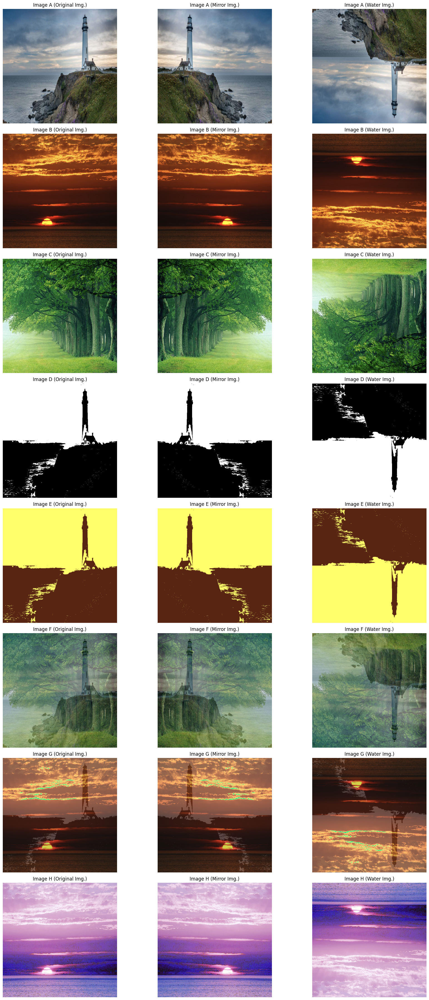

Displayed originals with both mirror image(horizontal flip) and water image(vertical flip) successfully.


In [5]:
import cv2
import matplotlib.pyplot as plt

ImagePaths = [
    r"X:\Projects\DIP\Assignment-1\fig1_a.png",
    r"X:\Projects\DIP\Assignment-1\fig1_b.png",
    r"X:\Projects\DIP\Assignment-1\fig1_c.png",
    r"X:\Projects\DIP\Assignment-1\fig1_d.png",
    r"X:\Projects\DIP\Assignment-1\fig1_e.png",
    r"X:\Projects\DIP\Assignment-1\fig1_f.png",
    r"X:\Projects\DIP\Assignment-1\fig1_g.png",
    r"X:\Projects\DIP\Assignment-1\fig1_h.png"
]

ImageLabels = ["Image A", "Image B", "Image C", "Image D", "Image E", "Image F", "Image G", "Image H"]

OriginalSet = [cv2.imread(path) for path in ImagePaths]
MirrorSet = [img[:, ::-1] for img in OriginalSet]
WaterSet  = [img[::-1, :] for img in OriginalSet]

print("Loaded all input images and generated mirror image(horizontal flip) and water image(vertical flip).")

plt.figure(figsize=(18, 36))
for Index, (OriginalImage, MirrorImage, WaterImage, Label) in enumerate(zip(OriginalSet, MirrorSet, WaterSet, ImageLabels)):
    plt.subplot(8, 3, 3 * Index + 1)
    plt.imshow(OriginalImage[:, :, ::-1])
    plt.title(f"{Label} (Original Img.)")
    plt.axis("off")
    plt.subplot(8, 3, 3 * Index + 2)
    plt.imshow(MirrorImage[:, :, ::-1])
    plt.title(f"{Label} (Mirror Img.)")
    plt.axis("off")
    plt.subplot(8, 3, 3 * Index + 3)
    plt.imshow(WaterImage[:, :, ::-1])
    plt.title(f"{Label} (Water Img.)")
    plt.axis("off")
plt.tight_layout()
plt.show()
print("Displayed originals with both mirror image(horizontal flip) and water image(vertical flip) successfully.")

### **Section-C: Operations on Image II**

##### **Part-1**

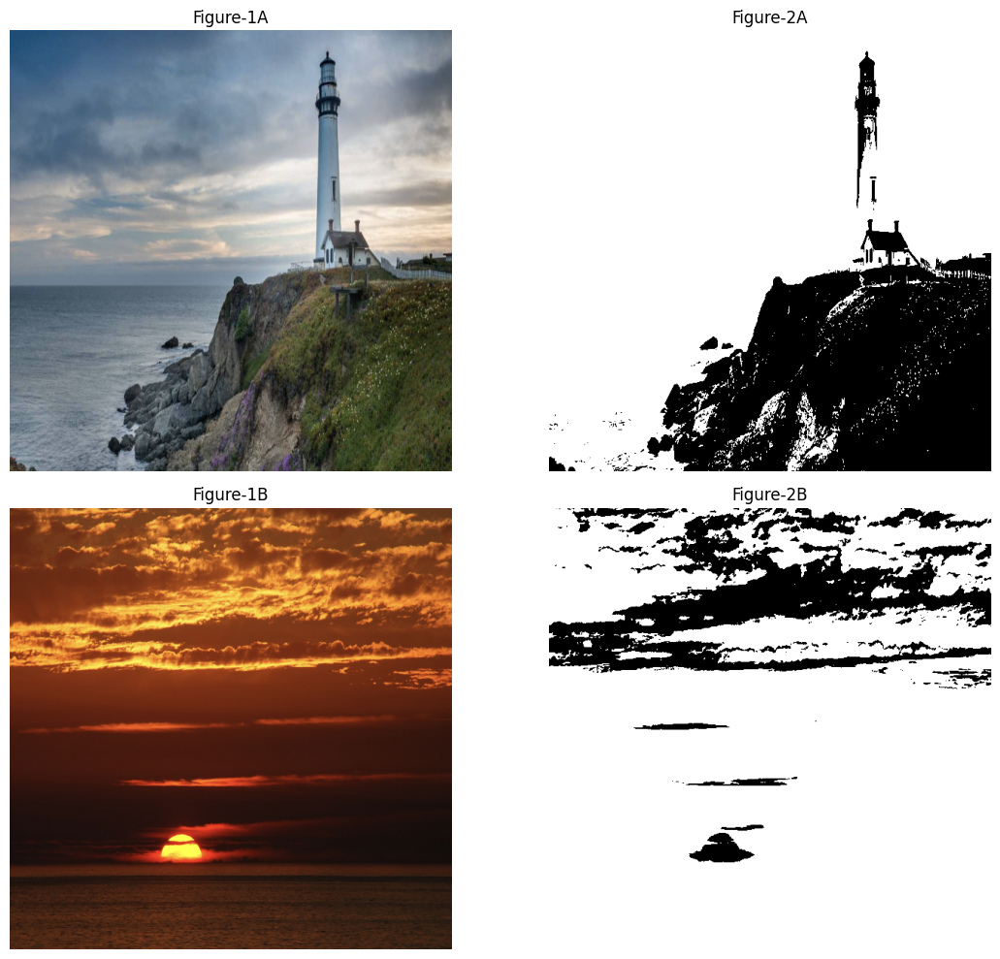

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

ImagePathA = r"X:\Projects\DIP\Assignment-1\fig1_a.png"
OutputPathA = r"X:\Projects\DIP\Assignment-1\fig2_a.png"
ImagePathB = r"X:\Projects\DIP\Assignment-1\fig1_b.png"
OutputPathB = r"X:\Projects\DIP\Assignment-1\fig2_b.png"

def ToGray(Image):
    B = Image[..., 0].astype(np.float32)
    G = Image[..., 1].astype(np.float32)
    R = Image[..., 2].astype(np.float32)
    Y = 0.114 * B + 0.587 * G + 0.299 * R
    return np.clip(Y, 0, 255).astype(np.uint8)

def PolyMask(H, W, Points):
    Mask = np.zeros((H, W), dtype=np.uint8)
    Ys = [p[1] for p in Points]
    MinY = max(0, min(Ys))
    MaxY = min(H - 1, max(Ys))
    N = len(Points)
    for Y in range(MinY, MaxY + 1):
        XInts = []
        for i in range(N):
            X1, Y1 = Points[i]
            X2, Y2 = Points[(i + 1) % N]
            if Y1 == Y2:
                continue
            if (Y >= min(Y1, Y2)) and (Y < max(Y1, Y2)):
                X = X1 + (Y - Y1) * (X2 - X1) / (Y2 - Y1)
                XInts.append(X)
        if not XInts:
            continue
        XInts.sort()
        for j in range(0, len(XInts) - 1, 2):
            L = int(np.ceil(XInts[j]))
            R = int(np.floor(XInts[j + 1]))
            if R >= 0 and L < W:
                Lc = max(0, L)
                Rc = min(W - 1, R)
                if Rc >= Lc:
                    Mask[Y, Lc:Rc + 1] = 255
    return Mask

def OtsuThresh(Gray):
    Hist = np.bincount(Gray.ravel(), minlength=256).astype(np.float64)
    Total = Gray.size
    Cum = np.cumsum(Hist)
    CumMean = np.cumsum(Hist * np.arange(256))
    GlobalMean = CumMean[-1] / Total
    Den = Cum * (Total - Cum)
    Num = (GlobalMean * Cum - CumMean) ** 2
    Den[Den == 0] = 1
    SigmaB = Num / Den
    T = int(np.argmax(SigmaB))
    return T

ImageA = cv2.imread(ImagePathA)
GrayA = ToGray(ImageA)
HA, WA = GrayA.shape
HalfA = HA // 2
BinaryA = np.zeros((HA, WA), dtype=np.uint8)
BinaryA[:HalfA, :] = (GrayA[:HalfA, :] >= 125).astype(np.uint8) * 255
BinaryA[HalfA:, :] = (GrayA[HalfA:, :] >= 105).astype(np.uint8) * 255
TrianglePtsA = [(0, 520), (0, 340), (290, 340), (200, 420), (150, 520)]
MaskA = PolyMask(HA, WA, TrianglePtsA)
BinaryA = np.maximum(BinaryA, MaskA)
Y1A, X2A = 300, 410
BinaryA[0:min(Y1A, HA), 0:min(X2A, WA)] = 255
Y1B, X1B, X2B = 250, 450, 600
BinaryA[0:min(Y1B, HA), max(0, X1B):min(X2B, WA)] = 255
cv2.imwrite(OutputPathA, BinaryA)

ImageB = cv2.imread(ImagePathB)
GrayB = ToGray(ImageB)
T = OtsuThresh(GrayB)
BinaryB = (GrayB >= T).astype(np.uint8) * 255
BinaryB = 255 - BinaryB
cv2.imwrite(OutputPathB, BinaryB)

plt.figure(figsize=(12, 10))
plt.subplot(2, 2, 1)
plt.imshow(ImageA[..., ::-1])
plt.title("Figure-1A")
plt.axis("off")
plt.subplot(2, 2, 2)
plt.imshow(BinaryA, cmap="gray")
plt.title("Figure-2A")
plt.axis("off")
plt.subplot(2, 2, 3)
plt.imshow(ImageB[..., ::-1])
plt.title("Figure-1B")
plt.axis("off")
plt.subplot(2, 2, 4)
plt.imshow(BinaryB, cmap="gray")
plt.title("Figure-2B")
plt.axis("off")
plt.tight_layout()
plt.show()

##### **Part-2**

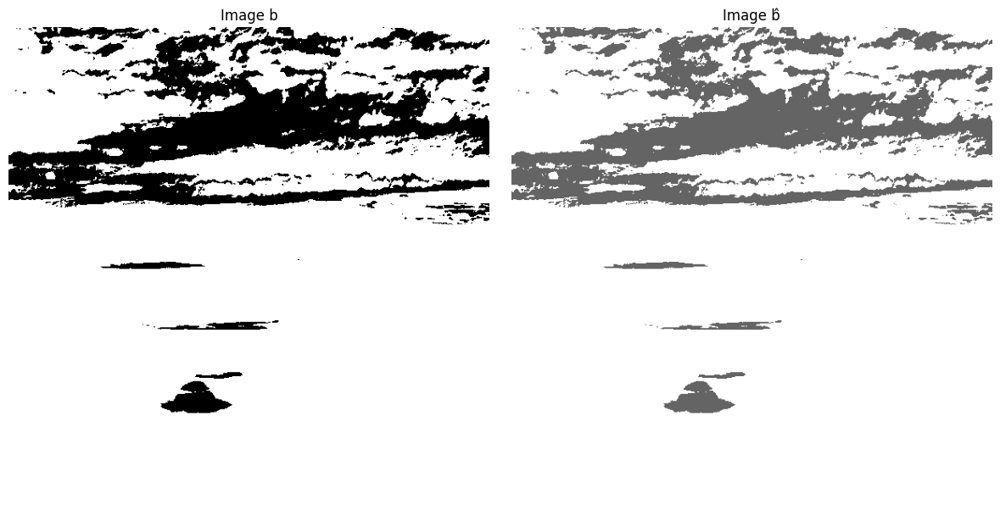

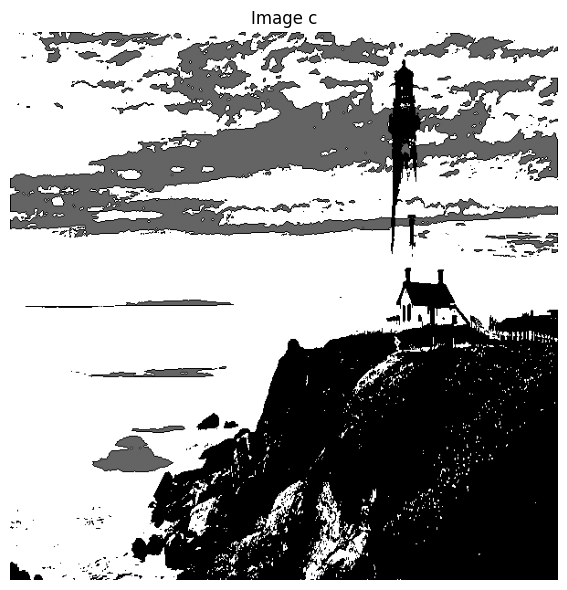

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

PathA = r"X:\Projects\DIP\Assignment-1\fig2_a.png"
PathB = r"X:\Projects\DIP\Assignment-1\fig2_b.png"
PathBhat = r"X:\Projects\DIP\Assignment-1\fig2_b_new.png"
PathC = r"X:\Projects\DIP\Assignment-1\fig2_c.png"

def MakeBhat(BImg):
    Out = BImg.copy()
    Out[Out == 0] = 100
    return Out

def ShiftBottomHalfLeft(Img, Pixels):
    Ht, Wd = Img.shape
    Mid = Ht // 2
    Out = Img.copy()
    Lower = Img[Mid:, :]
    Shf = np.full_like(Lower, 255)
    if Pixels < Wd:
        Shf[:, :-Pixels] = Lower[:, Pixels:]
    Out[Mid:, :] = Shf
    return Out

def ComposeWithAOnTop(Base, AImg):
    Out = Base.copy()
    Fore = (AImg != 255)
    Out[Fore] = AImg[Fore]
    return Out

def AddZeroBorderAround100(Img):
    M = (Img == 100).astype(np.uint8)
    P = np.pad(M, ((1,1),(1,1)), mode='constant', constant_values=0)
    Up    = P[:-2, 1:-1]
    Down  = P[ 2:, 1:-1]
    Left  = P[1:-1, :-2]
    Right = P[1:-1,  2:]
    Edge = (M == 1) & ((Up == 0) | (Down == 0) | (Left == 0) | (Right == 0))
    Out = Img.copy()
    Out[Edge] = 0
    return Out

ImgA = cv2.imread(PathA, cv2.IMREAD_GRAYSCALE)
ImgB = cv2.imread(PathB, cv2.IMREAD_GRAYSCALE)
BHat = MakeBhat(ImgB)
cv2.imwrite(PathBhat, BHat)
Shift = 100
BHatShift = ShiftBottomHalfLeft(BHat, Shift)
CImg = ComposeWithAOnTop(BHatShift, ImgA)
CImg = AddZeroBorderAround100(CImg)
cv2.imwrite(PathC, CImg)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(ImgB, cmap='gray', vmin=0, vmax=255)
plt.title("Image b")
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(BHat, cmap='gray', vmin=0, vmax=255)
plt.title("Image b̂")
plt.axis('off')
plt.tight_layout()
plt.show()
plt.figure(figsize=(6, 6))
plt.imshow(CImg, cmap='gray', vmin=0, vmax=255)
plt.title("Image c")
plt.axis('off')
plt.tight_layout()
plt.show()

##### **Part-3**

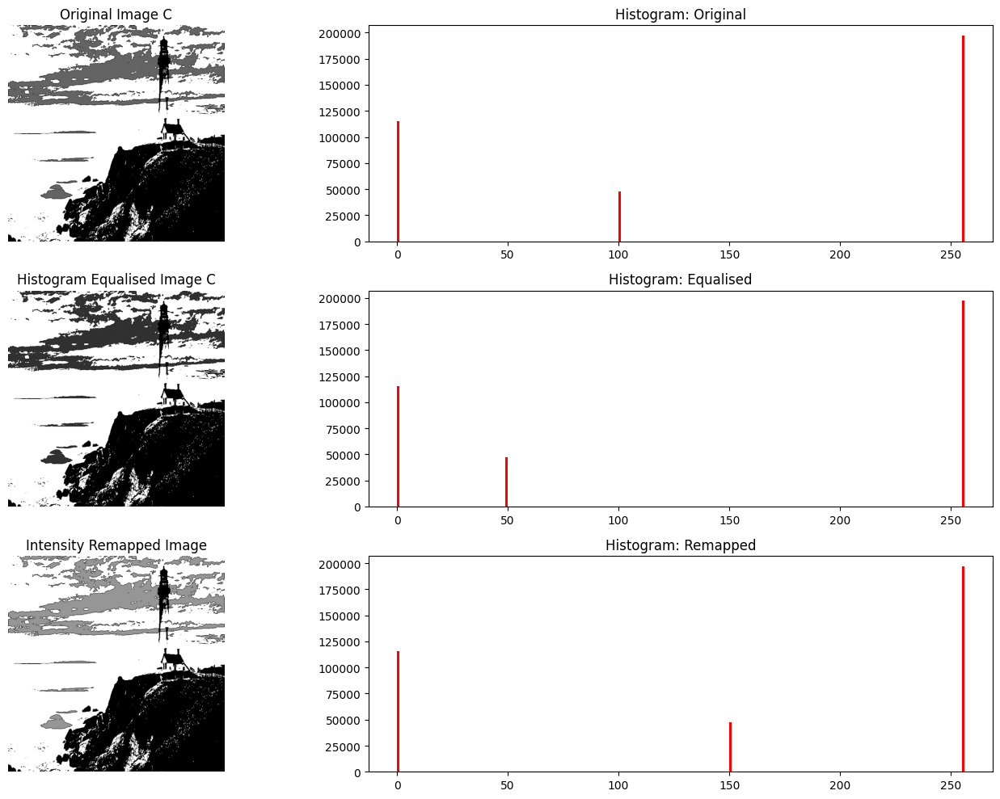

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

PathOriginalC = r"X:\Projects\DIP\Assignment-1\fig2_c.png"
PathEqualisedC = r"X:\Projects\DIP\Assignment-1\fig2_c_equal.png"
PathRemapC = r"X:\Projects\DIP\Assignment-1\fig2_c_remap.png"
ImageOriginalC = cv2.imread(PathOriginalC, cv2.IMREAD_GRAYSCALE)
Histogram = np.bincount(ImageOriginalC.ravel(), minlength=256)
PixelCount = ImageOriginalC.size
Cumulative = np.cumsum(Histogram)
LUT = np.floor((Cumulative - Cumulative.min()) * 255 / (PixelCount - Cumulative.min()))
LUT = LUT.astype(np.uint8)
ImageEqualisedC = LUT[ImageOriginalC]
cv2.imwrite(PathEqualisedC, ImageEqualisedC)
ImageRemapC = ImageOriginalC.copy()
ImageRemapC[ImageOriginalC == 100] = 150
cv2.imwrite(PathRemapC, ImageRemapC)

plt.figure(figsize=(15, 10))
plt.subplot(3, 2, 1)
plt.imshow(ImageOriginalC, cmap='gray')
plt.title("Original Image C")
plt.axis('off')
plt.subplot(3, 2, 2)
plt.hist(ImageOriginalC.ravel(), bins=256, range=[0, 256], color='red')
plt.title("Histogram: Original")
plt.subplot(3, 2, 3)
plt.imshow(ImageEqualisedC, cmap='gray')
plt.title("Histogram Equalised Image C")
plt.axis('off')
plt.subplot(3, 2, 4)
plt.hist(ImageEqualisedC.ravel(), bins=256, range=[0, 256], color='red')
plt.title("Histogram: Equalised")
plt.subplot(3, 2, 5)
plt.imshow(ImageRemapC, cmap='gray', vmin=0, vmax=255)
plt.title("Intensity Remapped Image")
plt.axis("off")
plt.subplot(3, 2, 6)
plt.hist(ImageRemapC.ravel(), bins=256, range=[0,256], color="red")
plt.title("Histogram: Remapped")
plt.tight_layout()
plt.show()

##### **Observation**
From the results, it is clear that the original image (c) mainly contains three intensity levels: 0 (black), 100 (grey), and 255 (white). This is also visible in its histogram which shows three sharp spikes corresponding to these values.

When I applied histogram equalisation, the three peaks were redistributed, and the grey level got shifted down to a lower intensity range (around 40–60). But since the image only has a few discrete intensity levels, the histogram still stayed clustered instead of being spread out smoothly. Because of this, the equalised image looked almost the same as the original, showing that histogram equalisation is not very useful for this kind of image.

To improve this, I tried intensity remapping. Here I directly mapped the mid-grey value (100) to 150, while keeping 0 and 255 the same. This simple change made the grey regions stand out more clearly against the black and white regions. The histogram after remapping also shows the grey peak shifted to 150, which gives better separation and contrast. Since the image has very limited pixel variety, direct remapping works particularly well here compared to global equalisation.

So overall, histogram equalisation did not add much improvement, but intensity remapping worked much better for this image. It directly handled the problem of poor separation of the mid-grey level and gave a visibly better result with less complexity.